In [2]:
from Tusc5ImageUtils import *
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
#%matplotlib inline
from skimage import exposure
mpl.rcParams['figure.dpi'] = 300
current_directory = os.getcwd()
print(f"Current Working Directory: {current_directory}")
###
from cellpose import utils, io, plot, models
from scipy.ndimage import binary_erosion, binary_fill_holes, center_of_mass
import subprocess
import pandas as pd
import nd2
from skimage.measure import regionprops

Current Working Directory: /Users/raphaeltinio/Lab Analysis MAC/ImageAnalysis


In [4]:
### Directory ###

parent_directory = os.path.dirname(current_directory) # Parent directory
test_stacks_directory = os.path.join(parent_directory, 'Test Stacks')

model_path_dapi = os.path.join(parent_directory, 'ImageAnalysis/cellpose_models/T5_DAPI_V1')
img_path = os.path.join(test_stacks_directory, '2007R_GLUT1_647_WGA_594_0002.nd2')

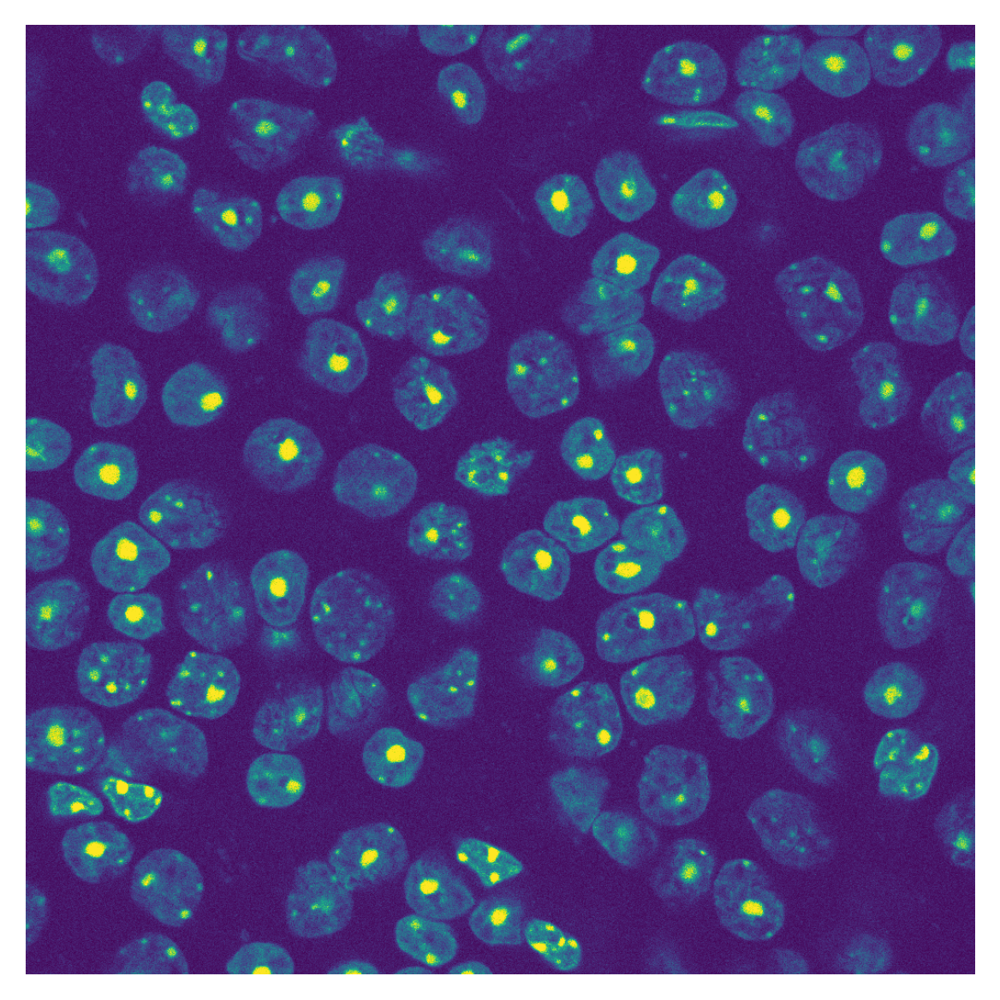

In [5]:
f = nd2.ND2File(img_path)
image = f.asarray()

DAPI_stack = to_8bit(image[:,0,:,:].copy())
eGFP_stack = to_8bit(image[:,1,:,:].copy())
WGA_stack = to_8bit(image[:,2,:,:].copy())

mp_DAPI = max_proj(DAPI_stack)

model = models.CellposeModel(pretrained_model=model_path_dapi)
masks, flows, styles = model.eval(mp_DAPI, diameter=None, channels=[0,0])

/Users/raphaeltinio/opt/anaconda3/lib/python3.9/site-packages/scipy/ndimage/_measurements.py:1535: RuntimeWarning: invalid value encountered in scalar divide
  results = [sum(input * grids[dir].astype(float), labels, index) / normalizer


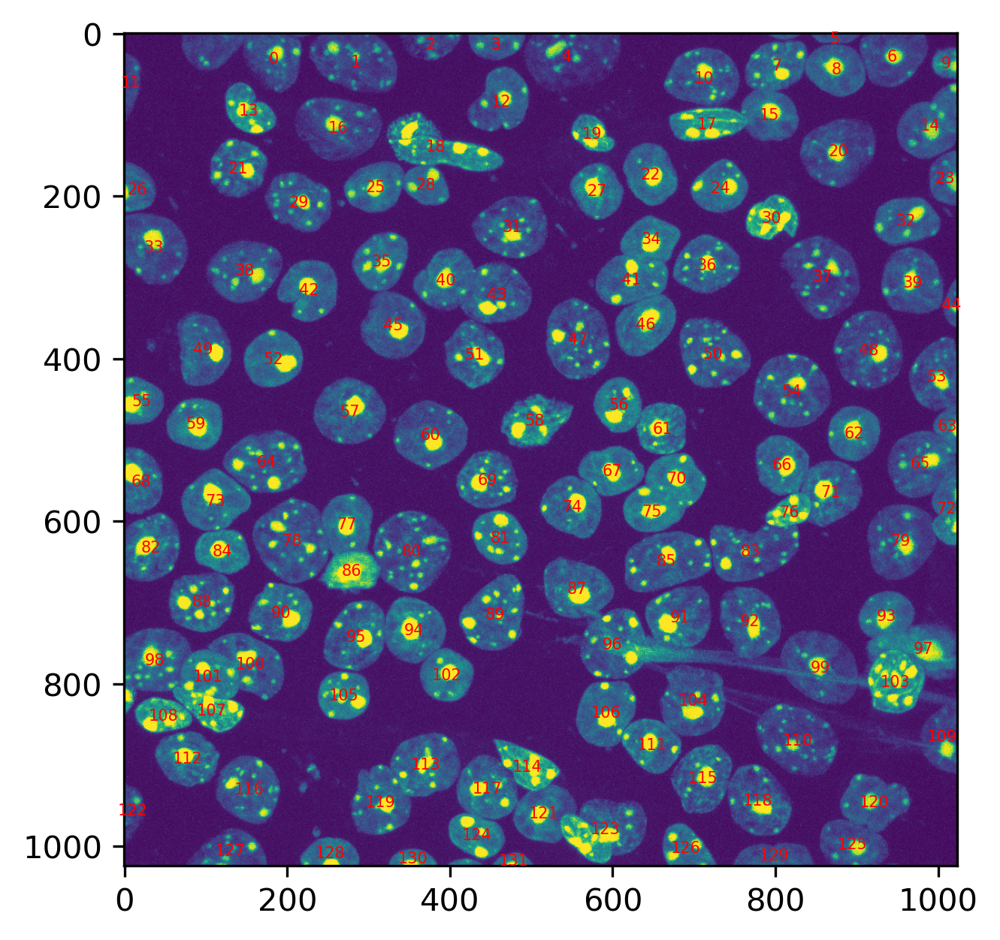

In [6]:
DAPI_coords = get_nuclei_position(masks)
plt.imshow(mp_DAPI)
plot_maskids(DAPI_coords, text_color = 'white', font_size = 8)
plt.axis('off')

(-0.5, 1023.5, 1023.5, -0.5)

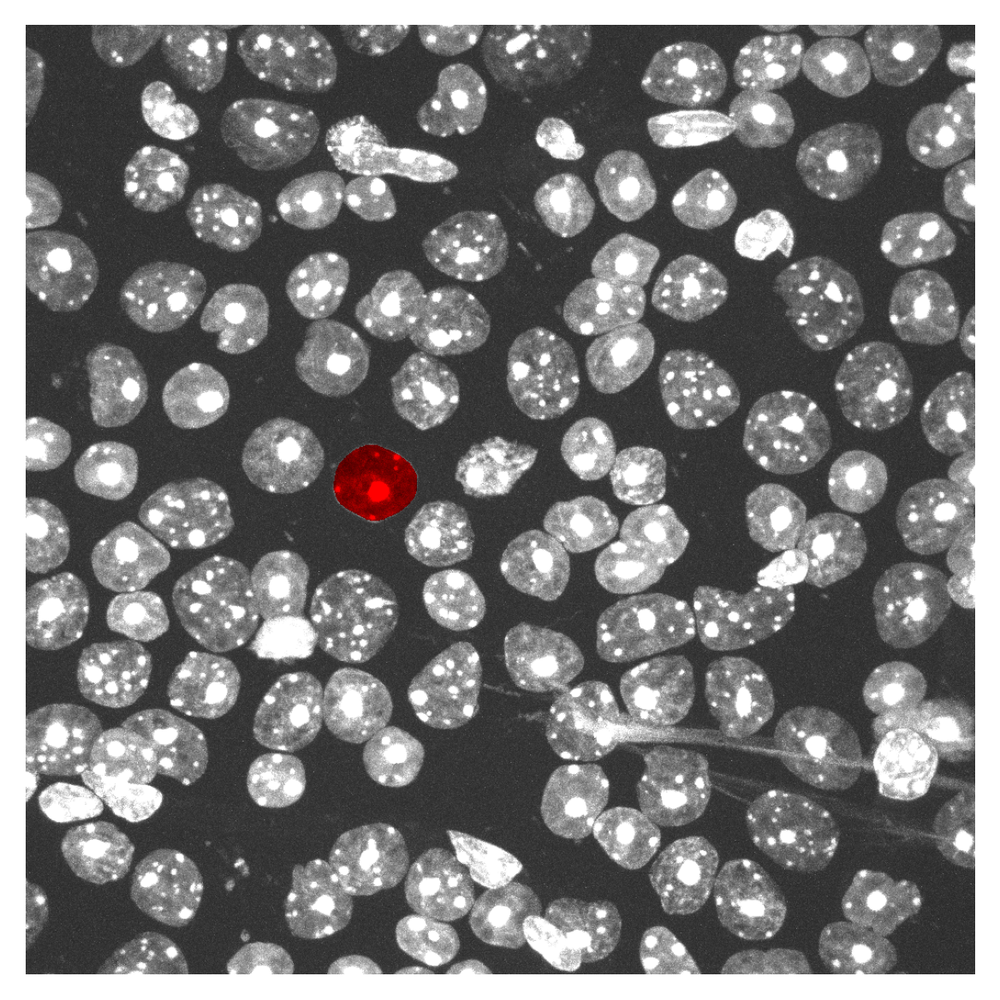

In [7]:
single_mask = masks.copy() == 62
plt.imshow(plot.mask_overlay(mp_DAPI, single_mask.astype(int)))
plt.axis('off')

# Reverse Max Proj

In [8]:
import numpy as np
from skimage import io, measure, color

# Load the binary mask image
#mask = io.imread('path_to_your_mask_image.png', as_gray=True)

# Ensure the image is binary (0 and 1)
#binary_mask = mask > 0.5

# Label connected regions in the binary image
labeled_mask = measure.label(single_mask)

# Measure region properties
regions = measure.regionprops(labeled_mask)

# Assume the largest region is the object of interest
largest_region = max(regions, key=lambda r: r.area)

# Get the equivalent diameter
diameter = largest_region.equivalent_diameter

print(f'The diameter of the mask is: {diameter} pixels')


The diameter of the mask is: 84.27413707972771 pixels


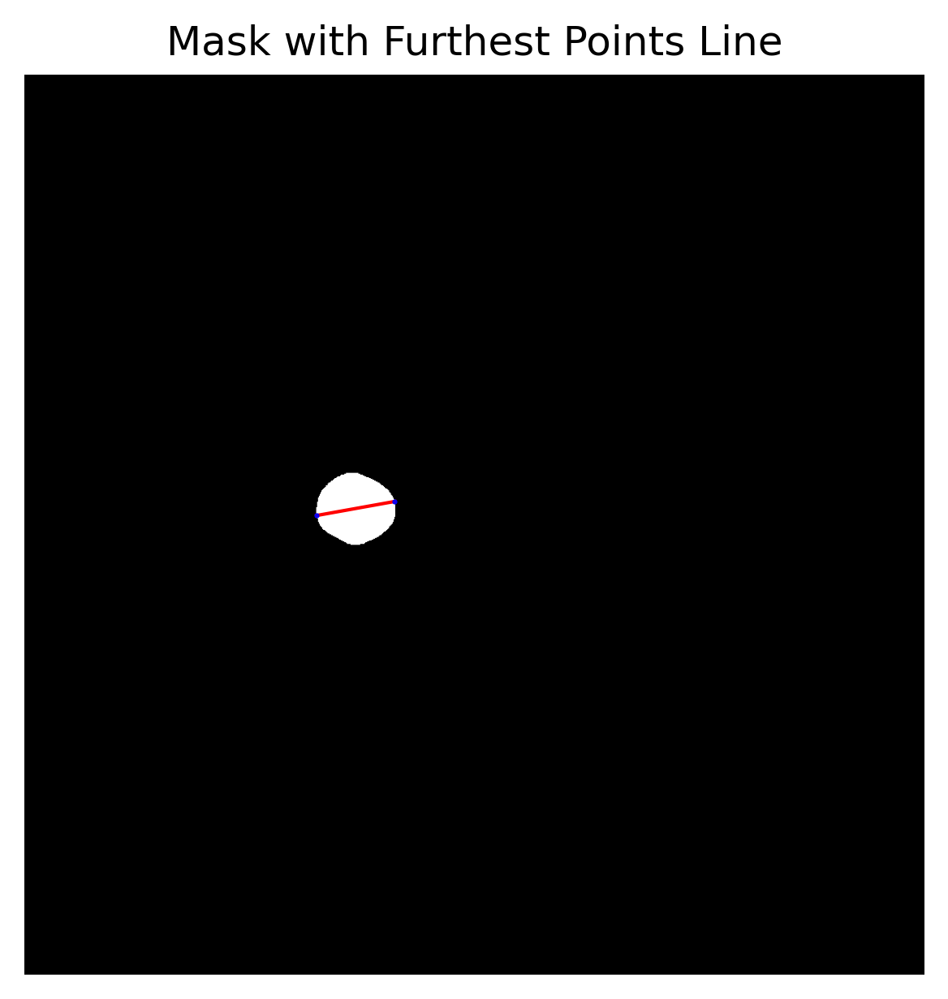

In [9]:
import numpy as np
from skimage import io, measure
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull, distance_matrix

# Load the binary mask image
#single_mask = io.imread('path_to_your_mask_image.png', as_gray=True)

# Ensure the image is binary (0 and 1)
#binary_mask = single_mask > 0.5

# Label connected regions in the binary image
labeled_mask = measure.label(single_mask)

# Measure region properties
regions = measure.regionprops(labeled_mask)

# Assume the largest region is the object of interest
largest_region = max(regions, key=lambda r: r.area)

# Get the coordinates of the largest region's convex hull
coords = largest_region.coords
hull = ConvexHull(coords)

# Extract the points from the convex hull
hull_points = coords[hull.vertices]

# Compute all pairwise distances between hull points
distances = distance_matrix(hull_points, hull_points)

# Find the pair of points with the maximum distance
max_dist_indices = np.unravel_index(np.argmax(distances), distances.shape)
point1 = hull_points[max_dist_indices[0]]
point2 = hull_points[max_dist_indices[1]]

# Create a figure and axis
fig, ax = plt.subplots()

# Display the mask
ax.imshow(single_mask, cmap='gray')

# Plot the furthest points and the line connecting them
ax.plot([point1[1], point2[1]], [point1[0], point2[0]], 'r-', linewidth=1)
ax.plot(point1[1], point1[0], 'bo', markersize = .5)
ax.plot(point2[1], point2[0], 'bo', markersize = .5)

# Set title and display the plot
ax.set_title(f'Mask with Furthest Points Line')
plt.axis('off')
plt.show()


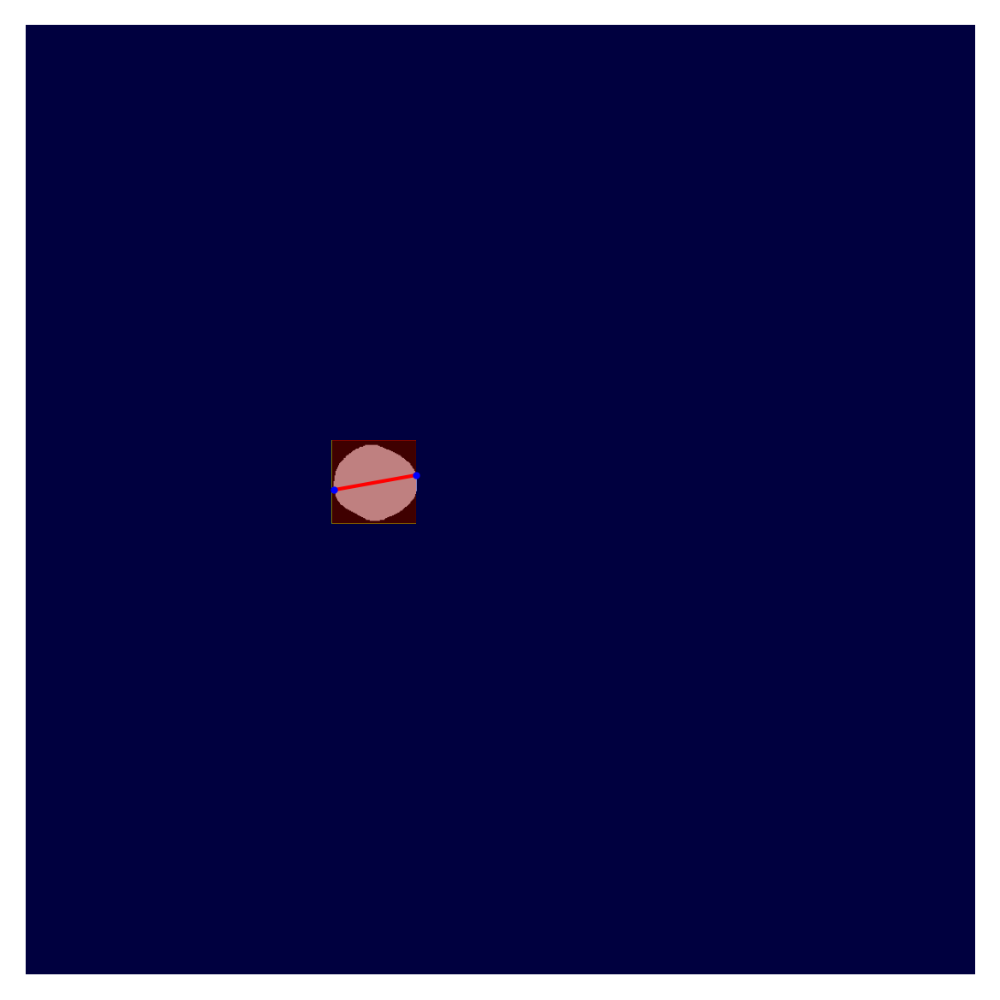

In [10]:
import numpy as np
from skimage import io, measure
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull, distance_matrix

# Load the binary mask image
# single_mask = io.imread('path_to_your_mask_image.png', as_gray=True)

# Ensure the image is binary (0 and 1)
# binary_mask = single_mask > 0.5

# Label connected regions in the binary image
labeled_mask = measure.label(single_mask)

# Measure region properties
regions = measure.regionprops(labeled_mask)

# Assume the largest region is the object of interest
largest_region = max(regions, key=lambda r: r.area)

# Get the coordinates of the largest region's convex hull
coords = largest_region.coords
hull = ConvexHull(coords)

# Extract the points from the convex hull
hull_points = coords[hull.vertices]

# Compute all pairwise distances between hull points
distances = distance_matrix(hull_points, hull_points)

# Find the pair of points with the maximum distance
max_dist_indices = np.unravel_index(np.argmax(distances), distances.shape)
point1 = hull_points[max_dist_indices[0]]
point2 = hull_points[max_dist_indices[1]]

# Get the equivalent diameter and centroid
diameter = np.linalg.norm(point1 - point2)
centroid = largest_region.centroid

# Increase the diameter by 50%
new_diameter = diameter * 1

# Calculate the size of the square side
square_side = new_diameter

# Calculate the top-left and bottom-right coordinates of the square
top_left = (int(centroid[0] - square_side / 2), int(centroid[1] - square_side / 2))
bottom_right = (int(centroid[0] + square_side / 2), int(centroid[1] + square_side / 2))

# Ensure the coordinates are within the image bounds
top_left = (max(top_left[0], 0), max(top_left[1], 0))
bottom_right = (min(bottom_right[0], single_mask.shape[0]), min(bottom_right[1], single_mask.shape[1]))

# Create a new mask with the square
new_mask = np.zeros_like(single_mask)
new_mask[top_left[0]:bottom_right[0], top_left[1]:bottom_right[1]] = 1

# Create a figure and axis
#fig, ax = plt.subplots(figsize=(6, 6))

# Display the original mask with the overlaid square mask
plt.imshow(np.zeros_like(single_mask), cmap='gray')  # Black background
plt.imshow(single_mask, cmap='gray', alpha=1.0)     # Original mask with transparency
plt.imshow(new_mask, cmap='jet', alpha=0.5)         # New mask with transparency

# Plot the furthest points and the line connecting them
plt.plot([point1[1], point2[1]], [point1[0], point2[0]], 'r-', linewidth=1)
plt.plot(point1[1], point1[0], 'bo', markersize=1)
plt.plot(point2[1], point2[0], 'bo', markersize=1)

plt.axis('off')

plt.show()


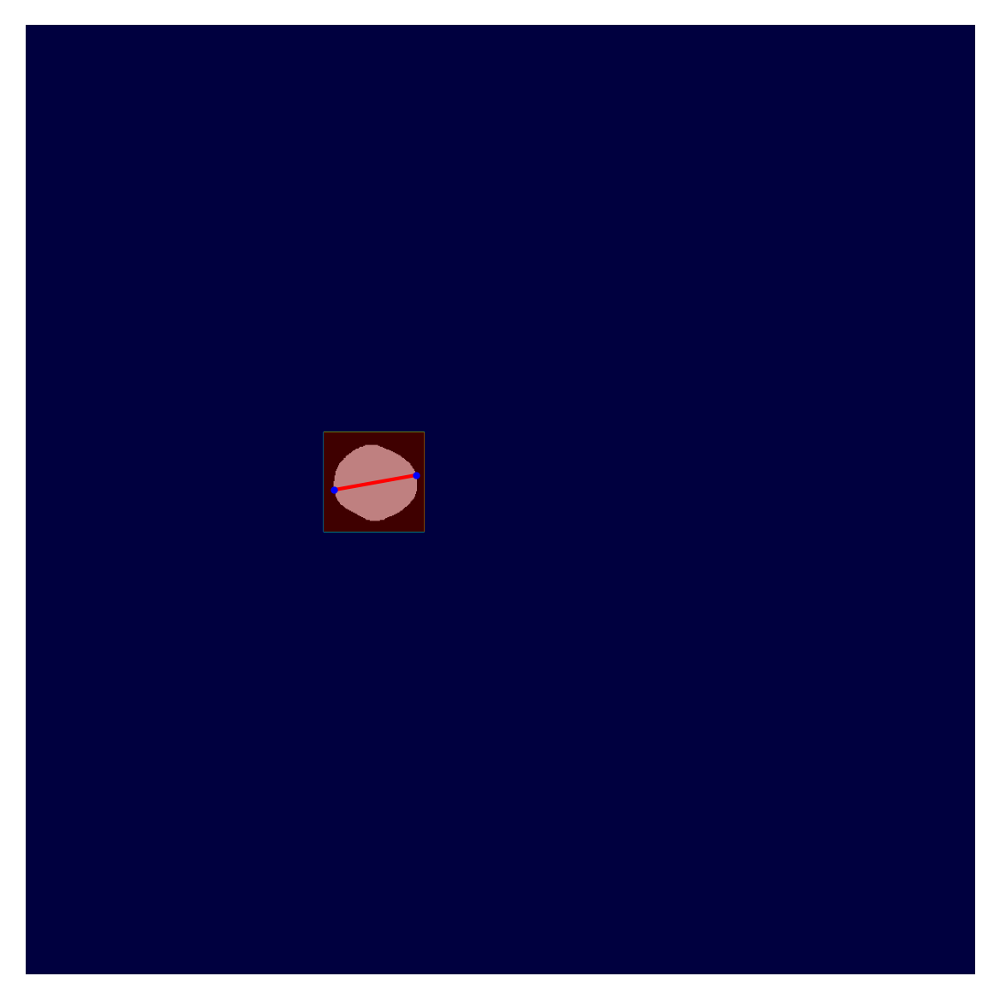

In [11]:
import numpy as np
from skimage import io, measure
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull, distance_matrix

# Load the binary mask image
# single_mask = io.imread('path_to_your_mask_image.png', as_gray=True)

# Ensure the image is binary (0 and 1)
# binary_mask = single_mask > 0.5

# Label connected regions in the binary image
labeled_mask = measure.label(single_mask)

# Measure region properties
regions = measure.regionprops(labeled_mask)

# Assume the largest region is the object of interest
largest_region = max(regions, key=lambda r: r.area)

# Get the coordinates of the largest region's convex hull
coords = largest_region.coords
hull = ConvexHull(coords)

# Extract the points from the convex hull
hull_points = coords[hull.vertices]

# Compute all pairwise distances between hull points
distances = distance_matrix(hull_points, hull_points)

# Find the pair of points with the maximum distance
max_dist_indices = np.unravel_index(np.argmax(distances), distances.shape)
point1 = hull_points[max_dist_indices[0]]
point2 = hull_points[max_dist_indices[1]]

# Get the equivalent diameter and centroid
diameter = np.linalg.norm(point1 - point2)
centroid = largest_region.centroid

# Increase the diameter by 50%
new_diameter = diameter * 1.40

# Calculate the size of the square side
square_side = new_diameter

# Calculate the top-left and bottom-right coordinates of the square
top_left = (int(centroid[0] - square_side / 2), int(centroid[1] - square_side / 2))
bottom_right = (int(centroid[0] + square_side / 2), int(centroid[1] + square_side / 2))

# Ensure the coordinates are within the image bounds
top_left = (max(top_left[0], 0), max(top_left[1], 0))
bottom_right = (min(bottom_right[0], single_mask.shape[0]), min(bottom_right[1], single_mask.shape[1]))

# Create a new mask with the square
new_mask = np.zeros_like(single_mask)
new_mask[top_left[0]:bottom_right[0], top_left[1]:bottom_right[1]] = 1

# Create a figure and axis
#fig, ax = plt.subplots(figsize=(6, 6))

# Display the original mask with the overlaid square mask
plt.imshow(np.zeros_like(single_mask), cmap='gray')  # Black background
plt.imshow(single_mask, cmap='gray', alpha=1.0)     # Original mask with transparency
plt.imshow(new_mask, cmap='jet', alpha=0.5)         # New mask with transparency

# Plot the furthest points and the line connecting them
plt.plot([point1[1], point2[1]], [point1[0], point2[0]], 'r-', linewidth=1)
plt.plot(point1[1], point1[0], 'bo', markersize=1)
plt.plot(point2[1], point2[0], 'bo', markersize=1)

plt.axis('off')

plt.show()


(-0.5, 1023.5, 1023.5, -0.5)

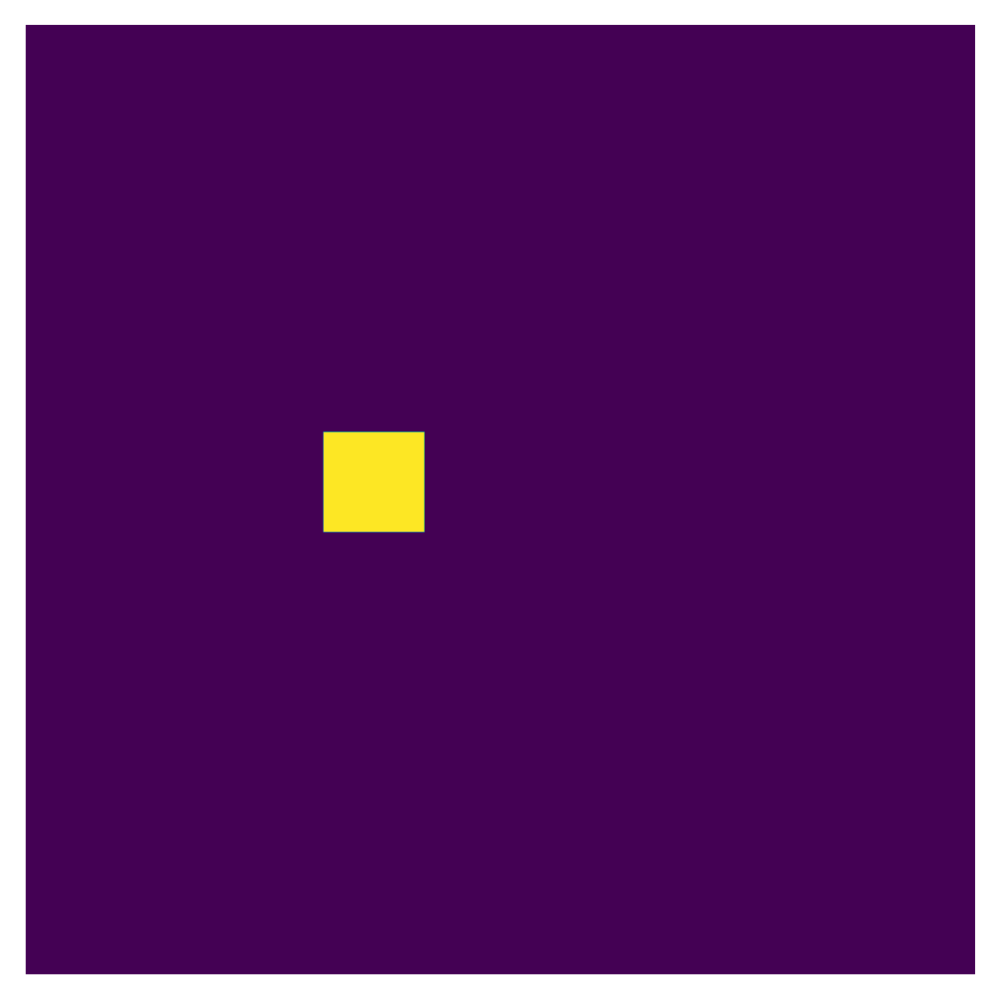

In [12]:
import numpy as np
from scipy.spatial import ConvexHull
from scipy.spatial import distance_matrix
from skimage import measure

def square_mask(mask, perc_increase: int = 40):
    """
    Create a square mask around the largest region of interest in a binary mask.
    Ensures the mask stays within the bounds of the image.

    Parameters:
    - mask: 2D numpy array (binary mask).
    - perc_increase: Percentage to increase the diameter of the square.

    Returns:
    - new_mask: 2D numpy array with the square mask.
    """
    # Label connected regions in the binary image
    labeled_mask = measure.label(mask)

    # Measure region properties
    regions = measure.regionprops(labeled_mask)

    # Assume the largest region is the object of interest
    largest_region = max(regions, key=lambda r: r.area)

    # Get the coordinates of the largest region's convex hull
    coords = largest_region.coords
    hull = ConvexHull(coords)

    # Extract the points from the convex hull
    hull_points = coords[hull.vertices]

    # Compute all pairwise distances between hull points
    distances = distance_matrix(hull_points, hull_points)

    # Find the pair of points with the maximum distance
    max_dist_indices = np.unravel_index(np.argmax(distances), distances.shape)
    point1 = hull_points[max_dist_indices[0]]
    point2 = hull_points[max_dist_indices[1]]

    # Get the equivalent diameter and centroid
    diameter = np.linalg.norm(point1 - point2)
    centroid = largest_region.centroid

    # Increase the diameter by however much
    new_diameter = diameter * (1 + perc_increase / 100)

    # Calculate the size of the square side
    square_side = new_diameter

    # Calculate the top-left and bottom-right coordinates of the square
    top_left = (int(centroid[0] - square_side / 2), int(centroid[1] - square_side / 2))
    bottom_right = (int(centroid[0] + square_side / 2), int(centroid[1] + square_side / 2))

    # Ensure the coordinates are within the image bounds
    top_left = (max(top_left[0], 0), max(top_left[1], 0))
    bottom_right = (min(bottom_right[0], mask.shape[0]), min(bottom_right[1], mask.shape[1]))

    # Create a new mask with the square
    new_mask = np.zeros_like(mask)
    new_mask[top_left[0]:bottom_right[0], top_left[1]:bottom_right[1]] = 1

    return new_mask

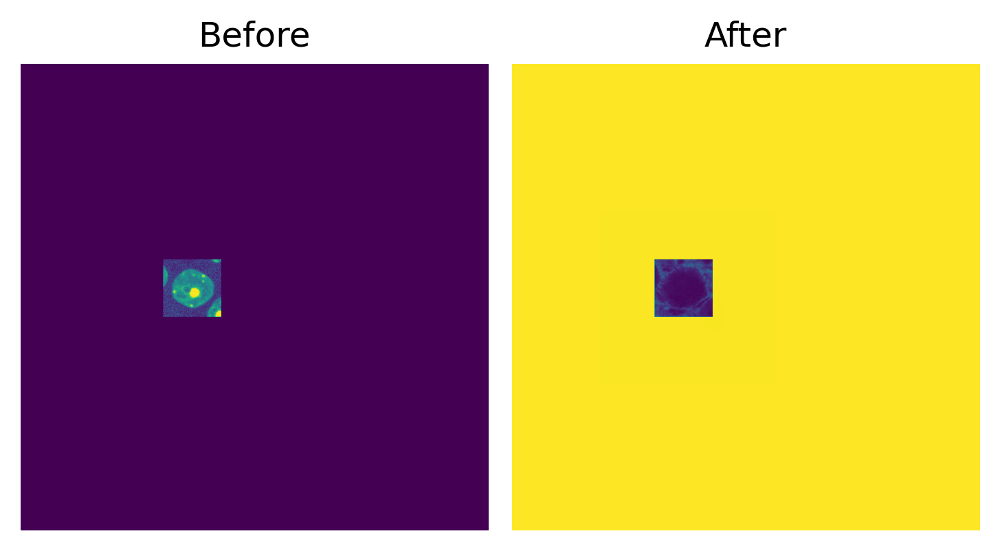

In [13]:
test_stack1 = DAPI_stack.copy()
test_stack1 = auto_brightness_contrast(max_proj(test_stack1[39:46,:,:]) * square_mask(single_mask))

test_stack2 = WGA_stack.copy()
test_stack2 = auto_brightness_contrast(max_proj(~test_stack2[39:46,:,:]) * square_mask(single_mask))

plot_2images(test_stack1, ~test_stack2, auto_bc = True)

# plot_before_after needs to be turned into plot_2images()

In [14]:
import numpy as np
from scipy.ndimage import measurements

def nuclei_com(single_channel, masks):
    """
    RETURNS MULTIPLE POINTS

    Returns the (x, y, z) coordinates of the center of mass for each mask.

    :param single_channel: 3D numpy array (slices, height, width) of a single channel.
    :param masks: 3D numpy array (same shape as single_channel) with mask labels.
    :return: List of tuples containing (x, y, z) coordinates of the center of mass.
    """
    total_masks = np.delete(np.unique(masks,0),0)
    
    centers_of_mass = []

    for mask in total_masks:
        single_mask = masks == mask

        masked_channel = single_channel * single_mask

        z_prof = np.sum(masked_channel, axis = (1,2))
        
        z_max_idx = np.argmax(z_prof)

        # Calculate the center of mass for the mask
        com = center_of_mass(single_mask)
        
        # The z coordinate of the center of mass is determined by the slice with the max intensity
        com_3d = (int(com[0]), int(com[1]), z_max_idx)

        centers_of_mass.append(com_3d)

    return centers_of_mass

# Example usage:
# Assuming 'image' is a 4D numpy array with shape (slices, channels, height, width)
# and 'masks' is a 3D numpy array with shape (slices, height, width)
centers_of_mass = nuclei_com(DAPI_stack, single_mask)
print(centers_of_mass)


[(493, 376, 42)]


In [15]:
import numpy as np
from scipy.ndimage import measurements

def nucleus_com(single_channel, masks):
    """
    RETURNS ONE POINT

    Returns the (x, y, z) coordinates of the center of mass for each mask.

    :param single_channel: 3D numpy array (slices, height, width) of a single channel.
    :param masks: 3D numpy array (same shape as single_channel) with mask labels.
    :return: List of tuples containing (x, y, z) coordinates of the center of mass.
    """
    total_masks = np.delete(np.unique(masks,0),0)
    

    for mask in total_masks:
        single_mask = masks == mask

        masked_channel = single_channel * single_mask

        z_prof = np.sum(masked_channel, axis = (1,2))
        
        z_max_idx = np.argmax(z_prof)

        # Calculate the center of mass for the mask
        com = center_of_mass(single_mask)
        
        # The z coordinate of the center of mass is determined by the slice with the max intensity
        com_3d = (int(com[0]), int(com[1]), z_max_idx)

    return com_3d

# Example usage:
# Assuming 'image' is a 4D numpy array with shape (slices, channels, height, width)
# and 'masks' is a 3D numpy array with shape (slices, height, width)
centers_of_mass = nucleus_com(DAPI_stack, single_mask)
print(centers_of_mass)


(493, 376, 42)


In [16]:
def WGA_projector(DAPI_stack, WGA_stack, single_mask, z_sep):
        
        sq_maski = square_mask(single_mask, perc_increase = 10)

        _, _, comzi = nucleus_com(DAPI_stack, single_mask) # Gets the nucleus stack of the middle of the cell

        #Looking for .5 microns above and below
        above_and_below = .6 // z_sep

        max_slice = int(comzi + above_and_below)
        min_slice = int(comzi - above_and_below)

        '''
        1. Takes the slices spanning the cell (0.5 microns above and below) and the slices within the square mask
        2. Take the max projection (image inversion if necessary)
        3. Auto brightness and contrast

        Returns the max projection of slice
        '''
        sq_stack = WGA_stack[min_slice : max_slice] * sq_maski

        sq_stack = ~auto_brightness_contrast(max_proj(~sq_stack)) # Need to add ~ to invert intensities, then ~ to revert back to normal

        # Take the square ROI of the stack and attach it to a larger image

        return sq_stack, sq_maski

_, _ = WGA_projector(DAPI_stack, WGA_stack, single_mask, .15)


In [17]:
'''
Returning z indicies where the nuclei of each roi has the greatest intensity
'''

def nuclei_slices(single_channel, masks):

    total_masks = np.delete(np.unique(masks,0),0)
    number_slices = single_channel.shape[0]
    
    max_z_slices = []

    for mask in total_masks:
        single_mask = masks == mask
        
        intensity_max = 0
        intensity_max_slice = 0

        for slice in range(number_slices):
            layer_intensity = np.sum(image[slice,0][single_mask])

            if layer_intensity > intensity_max:
                intensity_max = layer_intensity
                intensity_max_slice = slice

        max_z_slices.append(intensity_max_slice)

    return max_z_slices

# Result

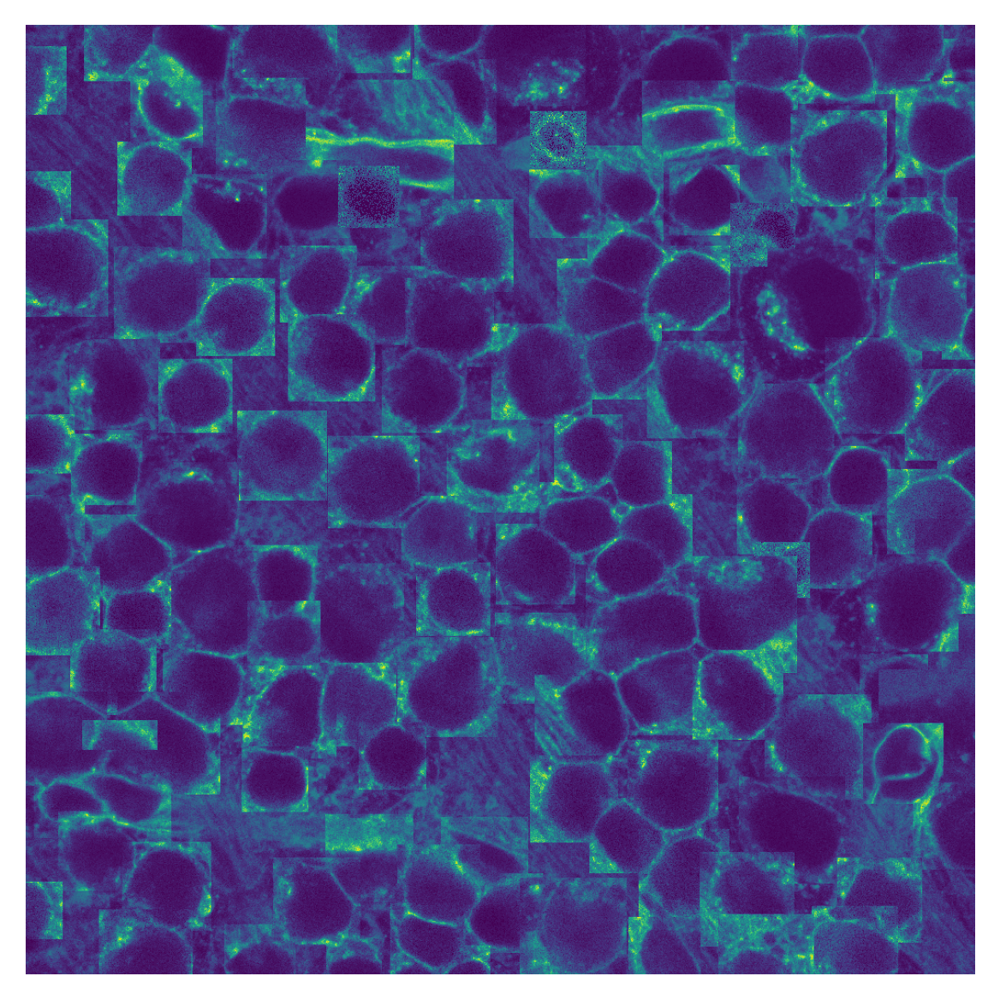

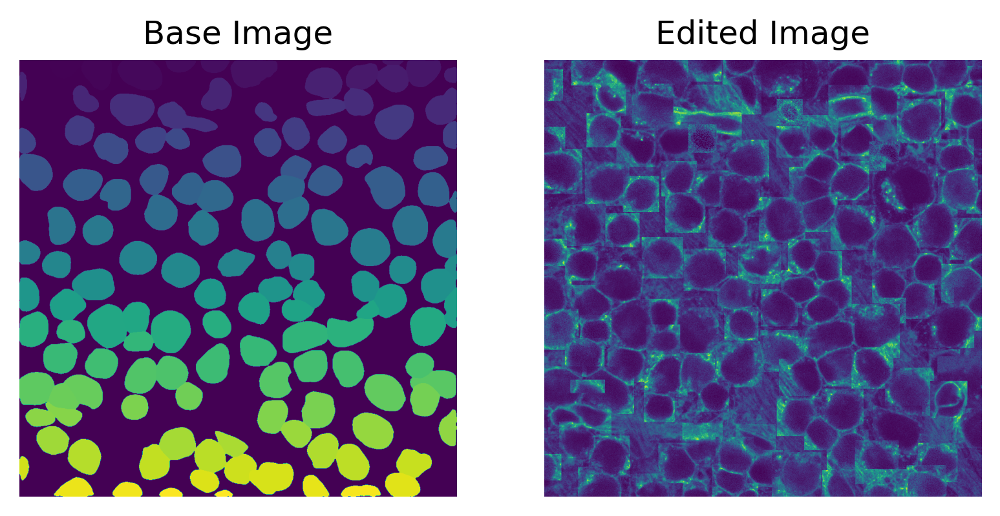

In [18]:
def WGA_stitcher(DAPI_stack, WGA_stack, masks, z_sep):

    # Background
    z_avg = np.mean(nuclei_slices(DAPI_stack, masks)).astype(int)
    base_stack = auto_brightness_contrast(WGA_stack.copy()[z_avg])

    total_masks = np.delete(np.unique(masks,0),0)

    for mask_num in total_masks:
        maski = masks == mask_num

        sq_stacki, sq_maski = WGA_projector(DAPI_stack, WGA_stack, maski, z_sep)
        base_stack[sq_maski] = sq_stacki[sq_maski]

    plt.imshow(base_stack)
    plt.axis('off')
    return base_stack

tx = WGA_stitcher(DAPI_stack, WGA_stack, masks, .15)


plot_before_after(masks,tx)